<a href="https://colab.research.google.com/github/Ritukuklani/Deep-Learning/blob/main/DLHW3Q4_Detectron2_Example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 723.9MB 25kB/s 
     |████████████████████████████████| 4.1MB 28.5MB/s 
  Found existing installation: torch 1.6.0+cu101
    Uninstalling torch-1.6.0+cu101:
      Successfully uninstalled torch-1.6.0+cu101
  Found existing installation: torchvision 0.7.0+cu101
    Uninstalling torchvision-0.7.0+cu101:
      Successfully uninstalled torchvision-0.7.0+cu101
     |████████████████████████████████| 276kB 5.5MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44075 sha256=31e3cd83c0d81ed5107cd783ffc1a6bceb238fd5c7c4e7261567b5d162afce39
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-b

In [ ]:
# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2 import model_zoo
import cv2

# get image
!wget https://images.fineartamerica.com/images-medium-large-5/central-park-balloon-man-madeline-ellis.jpg -O input.jpg
im = cv2.imread("./input.jpg")

# Create config
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_101_FPN_3x/137851257/model_final_f6e8b1.pkl"
# cfg.MODEL.WEIGHTS = "https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x/138205316/metrics.json"
cfg.MODEL.WEIGHTS = "https://dl.fbaipublicfiles.com/detectron2/COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x/137849621/model_final_a6e10b.pkl"

# Create predictor
predictor = DefaultPredictor(cfg)

# Make prediction
outputs = predictor(im)

--2020-10-17 04:03:06--  https://images.fineartamerica.com/images-medium-large-5/central-park-balloon-man-madeline-ellis.jpg
Resolving images.fineartamerica.com (images.fineartamerica.com)... 99.86.38.81, 99.86.38.64, 99.86.38.84, ...
Connecting to images.fineartamerica.com (images.fineartamerica.com)|99.86.38.81|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248003 (242K) [image/jpeg]
Saving to: ‘input.jpg’

input.jpg           100%[===================>] 242.19K  --.-KB/s    in 0.02s   

2020-10-17 04:03:06 (12.3 MB/s) - ‘input.jpg’ saved [248003/248003]



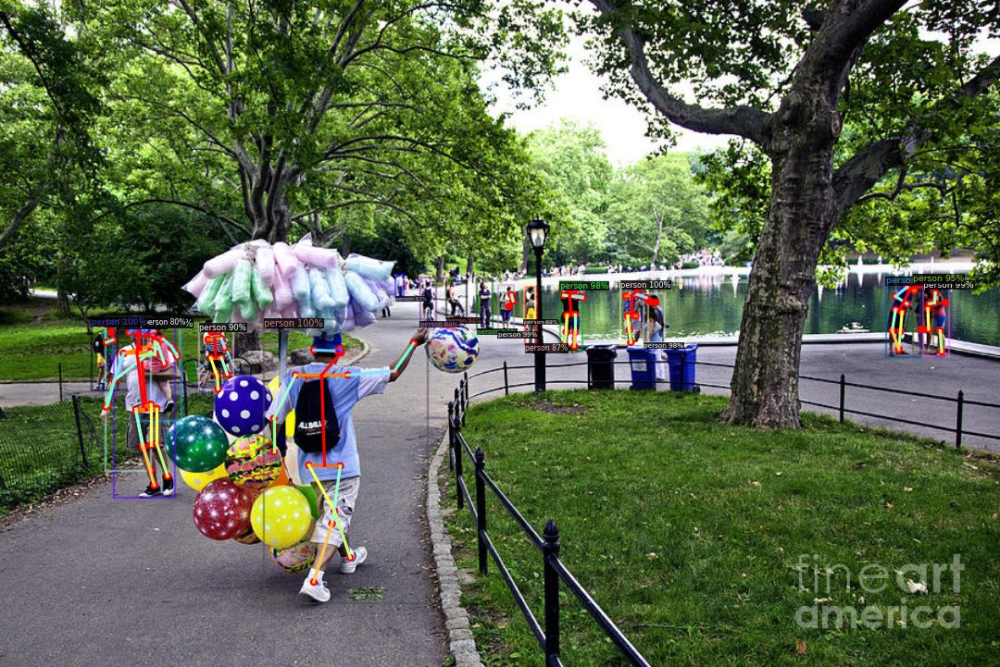

In [ ]:
from google.colab.patches import cv2_imshow
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

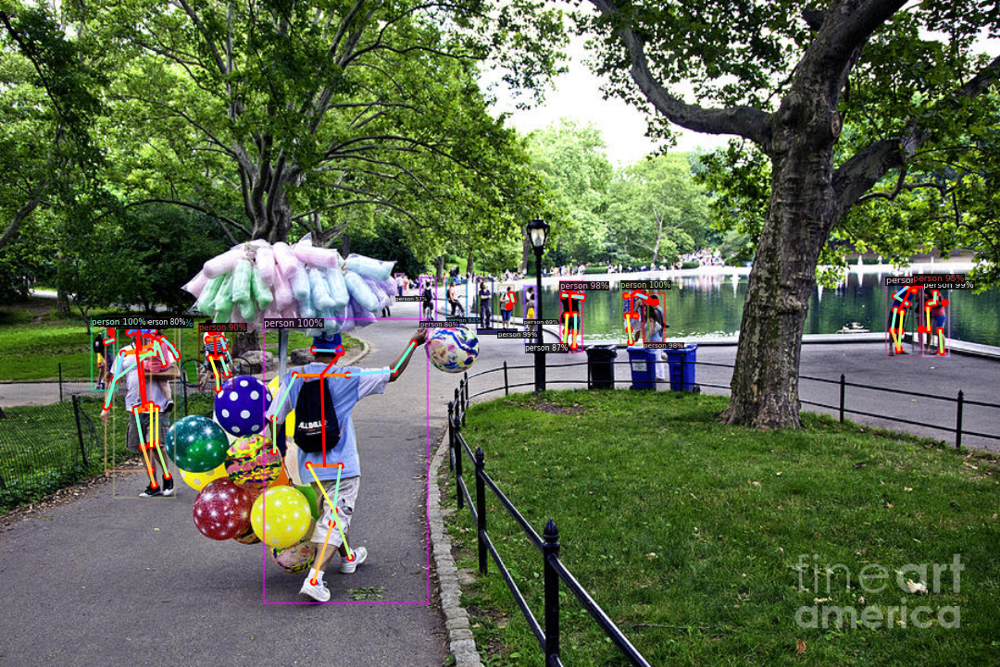

In [ ]:
from google.colab.patches import cv2_imshow
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
# https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x/137260431/model_final_a54504.pkl
# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2 import model_zoo
import cv2

# get image
!wget https://images.fineartamerica.com/images-medium-large-5/central-park-balloon-man-madeline-ellis.jpg -O input.jpg
im = cv2.imread("./input.jpg")

# Create config
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_101_FPN_3x/137851257/model_final_f6e8b1.pkl"
# cfg.MODEL.WEIGHTS = "https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x/138205316/metrics.json"
cfg.MODEL.WEIGHTS = "https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"

# Create predictor
predictor = DefaultPredictor(cfg)

# Make prediction
outputs = predictor(im)

--2020-10-17 03:52:25--  https://images.fineartamerica.com/images-medium-large-5/central-park-balloon-man-madeline-ellis.jpg
Resolving images.fineartamerica.com (images.fineartamerica.com)... 99.86.38.64, 99.86.38.84, 99.86.38.45, ...
Connecting to images.fineartamerica.com (images.fineartamerica.com)|99.86.38.64|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248003 (242K) [image/jpeg]
Saving to: ‘input.jpg’

input.jpg           100%[===================>] 242.19K  --.-KB/s    in 0.02s   

2020-10-17 03:52:25 (9.83 MB/s) - ‘input.jpg’ saved [248003/248003]



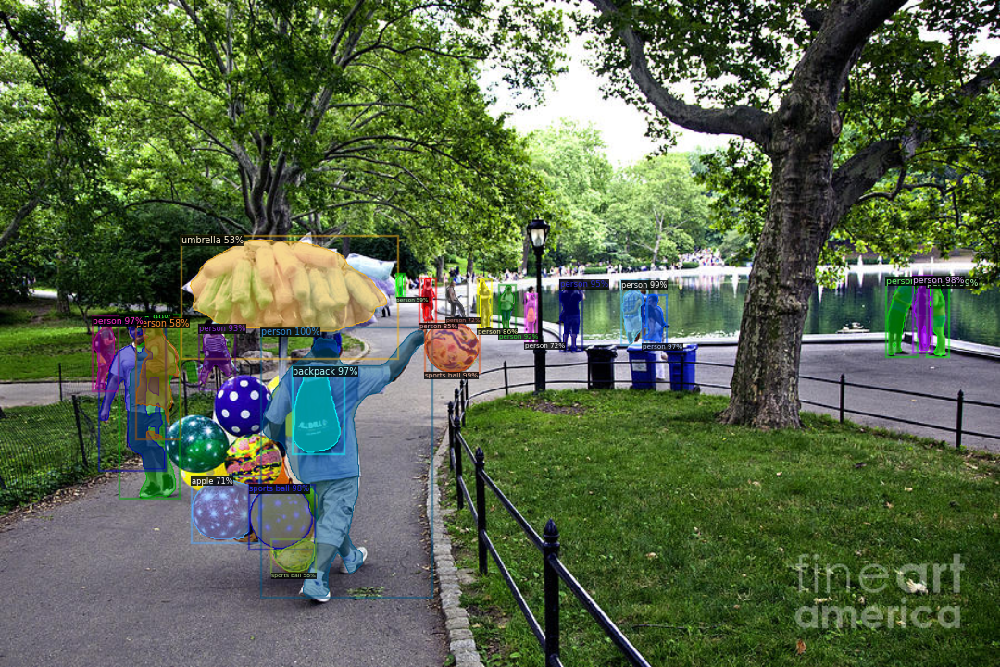

In [ ]:
from google.colab.patches import cv2_imshow
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools

# write a function that loads the dataset into detectron2's standard format
def get_balloon_dicts(img_dir):
    json_file = os.path.join(img_dir, "via_region_data.json")
    print(json_file)
    # json_file = "/balloon_dataset/train/via_region_data.json"
    with open(json_file) as f:
        imgs_anns = json.load(f)
    print(imgs_anns)

    dataset_dicts = []
    for _, v in imgs_anns.items():
        record = {}
        
        filename = os.path.join(img_dir, v["filename"])
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["height"] = height
        record["width"] = width
      
        annos = v["regions"]
        objs = []
        for _, anno in annos.items():
            assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = list(itertools.chain.from_iterable(poly))

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0,
                "iscrowd": 0
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts
# get_balloon_dicts("" + "train")
from detectron2.data import DatasetCatalog, MetadataCatalog
for d in ["train", "val"]:
    DatasetCatalog.register("balloon/" + d, lambda d=d: get_balloon_dicts("" + d))
    MetadataCatalog.get("balloon/" + d).set(thing_classes=["balloon"])
balloon_metadata = MetadataCatalog.get("balloon/train")


In [ ]:
import os
print(os.environ.get('HOME'))

/root


In [ ]:
print(os.path.join("train", "via_region_data.json"))

train/via_region_data.json


In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("balloon/train",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[10/17 03:52:27 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[10/17 03:52:31 d2.engine.train_loop]: Starting training from iteration 0
[10/17 03:52:40 d2.utils.events]:  eta: 0:02:03  iter: 19  total_loss: 2.139  loss_cls: 0.684  loss_box_reg: 0.670  loss_mask: 0.695  loss_rpn_cls: 0.024  loss_rpn_loc: 0.007  time: 0.4403  data_time: 0.0313  lr: 0.000005  max_mem: 2732M
[10/17 03:52:49 d2.utils.events]:  eta: 0:01:56  iter: 39  total_loss: 1.915  loss_cls: 0.650  loss_box_reg: 0.535  loss_mask: 0.667  loss_rpn_cls: 0.037  loss_rpn_loc: 0.013  time: 0.4466  data_time: 0.0063  lr: 0.000010  max_mem: 2855M
[10/17 03:52:58 d2.utils.events]:  eta: 0:01:50  iter: 59  total_loss: 1.957  loss_cls: 0.589  loss_box_reg: 0.722  loss_mask: 0.614  loss_rpn_cls: 0.031  loss_rpn_loc: 0.009  time: 0.4560  data_time: 0.0099  lr: 0.000015  max_mem: 2855M
[10/17 03:53:08 d2.utils.events]:  eta: 0:01:40  iter: 79  total_loss: 1.719  loss_cls: 0.488  loss_box_reg: 0.650  loss_mask: 0.547  loss_rpn_cls: 0.038  loss_rpn_loc: 0.007  time: 0.4557  data_time: 0.0070  lr:

train/via_region_data.json
{'34020010494_e5cb88e1c4_k.jpg1115004': {'fileref': '', 'size': 1115004, 'filename': '34020010494_e5cb88e1c4_k.jpg', 'base64_img_data': '', 'file_attributes': {}, 'regions': {'0': {'shape_attributes': {'name': 'polygon', 'all_points_x': [1020, 1000, 994, 1003, 1023, 1050, 1089, 1134, 1190, 1265, 1321, 1361, 1403, 1428, 1442, 1445, 1441, 1427, 1400, 1361, 1316, 1269, 1228, 1198, 1207, 1210, 1190, 1177, 1172, 1174, 1170, 1153, 1127, 1104, 1061, 1032, 1020], 'all_points_y': [963, 899, 841, 787, 738, 700, 663, 638, 621, 619, 643, 672, 720, 765, 800, 860, 896, 942, 990, 1035, 1079, 1112, 1129, 1134, 1144, 1153, 1166, 1166, 1150, 1136, 1129, 1122, 1112, 1084, 1037, 989, 963]}, 'region_attributes': {}}}}, '25899693952_7c8b8b9edc_k.jpg814535': {'fileref': '', 'size': 814535, 'filename': '25899693952_7c8b8b9edc_k.jpg', 'base64_img_data': '', 'file_attributes': {}, 'regions': {'0': {'shape_attributes': {'name': 'polygon', 'all_points_x': [586, 510, 441, 389, 331, 268, 

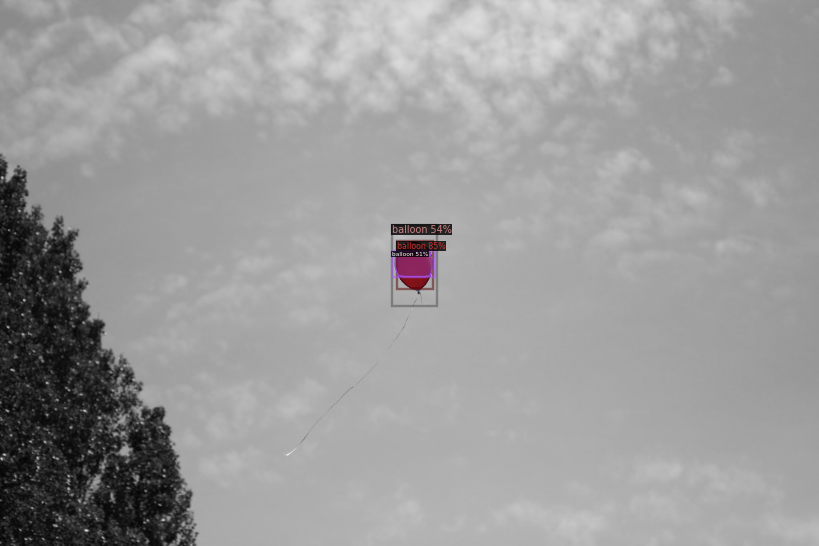

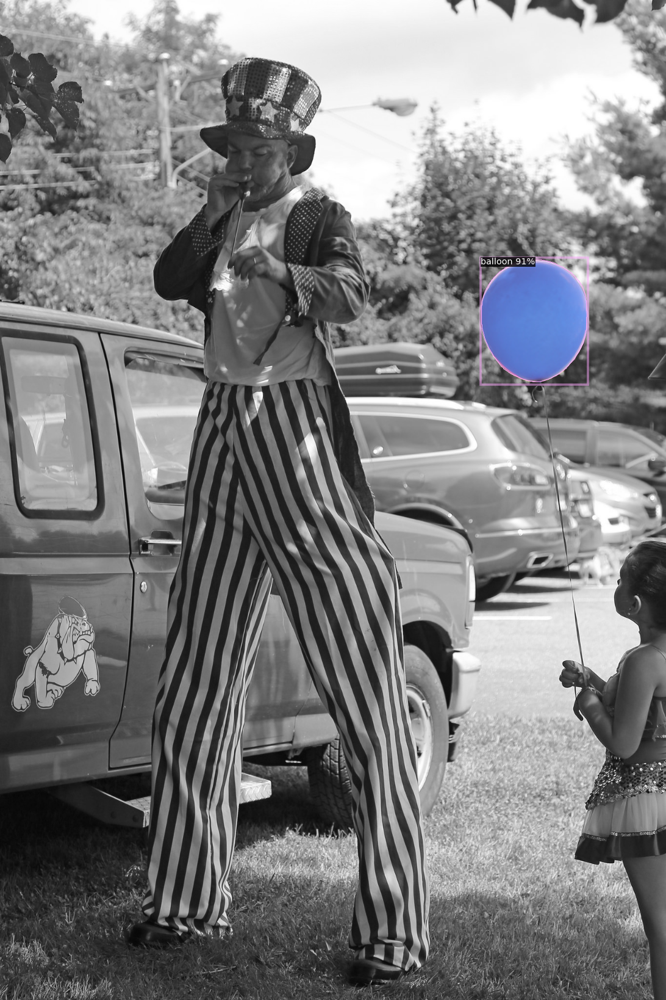

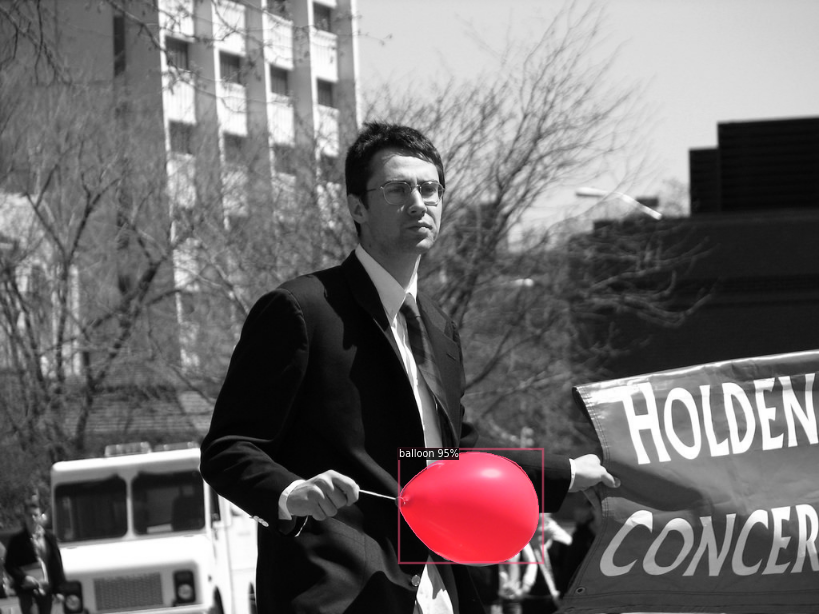

In [ ]:
from detectron2.utils.visualizer import ColorMode
import random
from detectron2 import model_zoo
import cv2

# load weights
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
# Set training data-set path
cfg.DATASETS.TEST = ("/test", )
# Create predictor (model for inference)
predictor = DefaultPredictor(cfg)

dataset_dicts = get_balloon_dicts("train")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=balloon_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
!wget https://images.fineartamerica.com/images-medium-large-5/central-park-balloon-man-madeline-ellis.jpg -O input.jpg
im = cv2.imread("./input.jpg")
predictor = DefaultPredictor(cfg)

# Make prediction
outputs = predictor(im)

--2020-10-17 03:56:36--  https://images.fineartamerica.com/images-medium-large-5/central-park-balloon-man-madeline-ellis.jpg
Resolving images.fineartamerica.com (images.fineartamerica.com)... 99.86.38.84, 99.86.38.45, 99.86.38.64, ...
Connecting to images.fineartamerica.com (images.fineartamerica.com)|99.86.38.84|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248003 (242K) [image/jpeg]
Saving to: ‘input.jpg’

input.jpg           100%[===================>] 242.19K  --.-KB/s    in 0.02s   

2020-10-17 03:56:36 (10.2 MB/s) - ‘input.jpg’ saved [248003/248003]



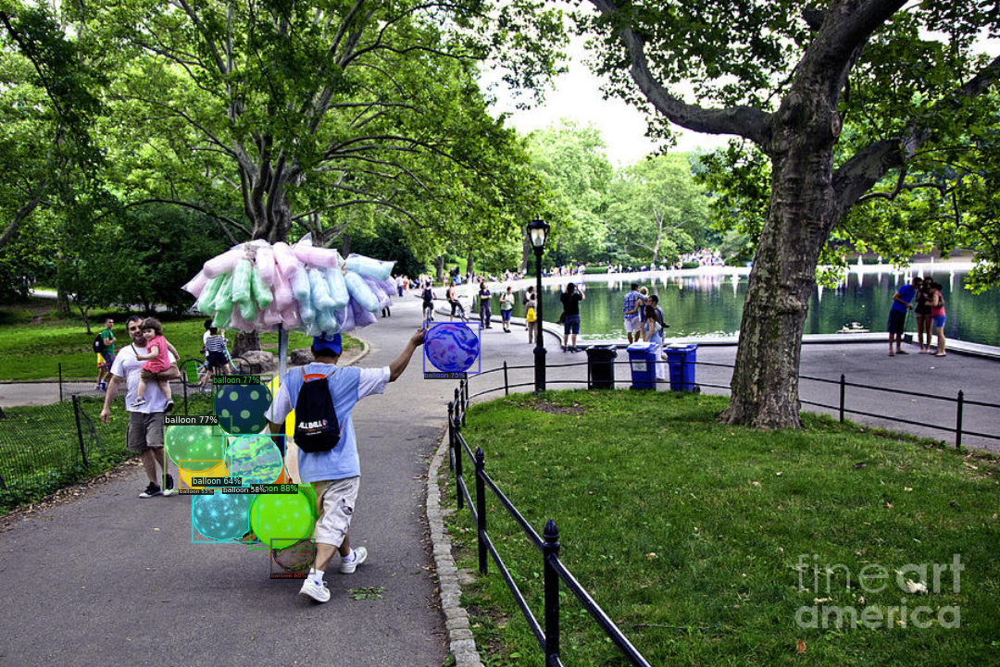

In [ ]:
from google.colab.patches import cv2_imshow
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])